## Lab 1 "Hearts"

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu, try_all_threshold, threshold_minimum, threshold_yen, threshold_local
from scipy.ndimage import correlate, gaussian_filter, sobel

from skimage.morphology import (erosion, dilation, opening, closing,  # noqa
                                white_tophat)
from skimage.morphology import black_tophat, skeletonize, convex_hull_image  # noqa
from skimage.morphology import disk, star  # noqa

from PIL import Image

In [2]:
def show_img(images, figsize=(10, 5), cmap=None):
    img_to_show = np.concatenate(images, axis=1)
    plt.figure(figsize=figsize)
    plt.imshow(img_to_show, cmap=cmap, vmin=0, vmax=255)
    plt.axis('off')
    plt.show()

In [3]:
def compare_images(img1, img2, figsize=(20, 10)):
    plt.figure(figsize=figsize)
    plt.subplot(121)
    plt.imshow(img1, cmap=plt.cm.gray)
    plt.axis('off')
    
    plt.subplot(122)
    plt.imshow(img2, cmap=plt.cm.gray)
    plt.axis('off')
    plt.show()

In [4]:
def compare_images_morph(img1, img2, figsize=(20, 10)):
    plt.figure(figsize=figsize)
    plt.subplot(121)
    plt.imshow(img1, cmap=plt.cm.gray, vmin=0, vmax=255)
    plt.axis('off')
    
    plt.subplot(122)
    plt.imshow(img2, cmap=plt.cm.gray, vmin=0, vmax=255)
    plt.axis('off')
    plt.show()

In [5]:
#hearts_1=cv2.imread('hearts 1.png')
hearts=[cv2.imread(f'hearts {i}.png') for i in range(1,11)]

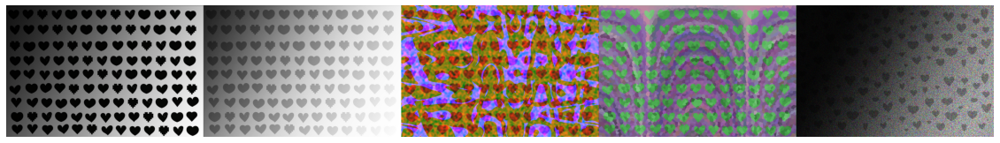

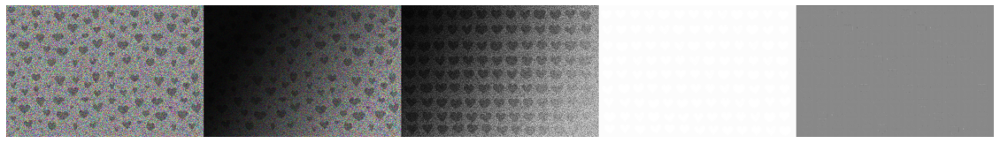

In [6]:
show_img(hearts[0:5], figsize=(20,10))
show_img(hearts[5:10], figsize=(20,10))

## Picture 1

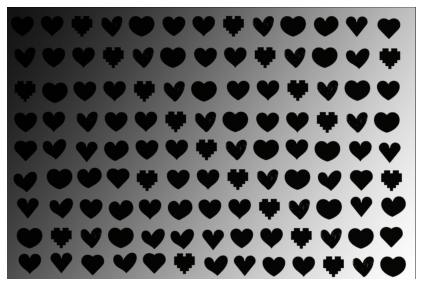

In [7]:
img_1 = hearts[0]
show_img([img_1])
b, g, r = cv2.split(img_1)

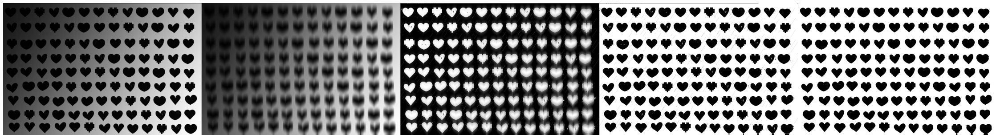

In [8]:
img_1=b
kernel = cv2.getGaussianKernel(60, 19) 
blurred_img = cv2.filter2D(src=img_1, ddepth=-1, kernel=kernel)
new_img = img_1-blurred_img
img_binary = (new_img < 128) * 255
footprint = disk(3)
opened = opening(closing(img_binary, footprint), footprint)
show_img([img_1, blurred_img, new_img, img_binary, opened], (40,100), cmap='gray')



## Picture 2

(851, 1280, 3)


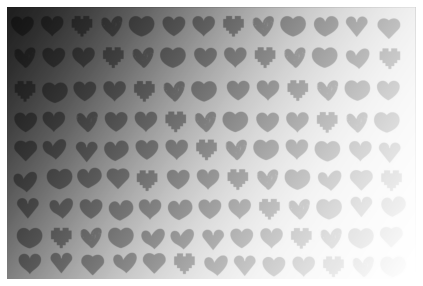

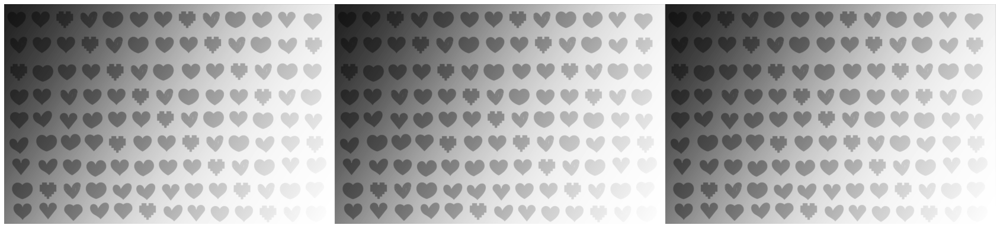

In [9]:
img_2 = hearts[1]
print(img_2.shape)
b,g,r=cv2.split(img_2)
show_img([img_2])
show_img([b, g, r], figsize=(30,20), cmap='gray')

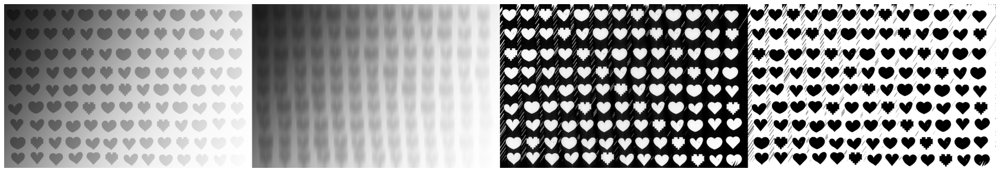

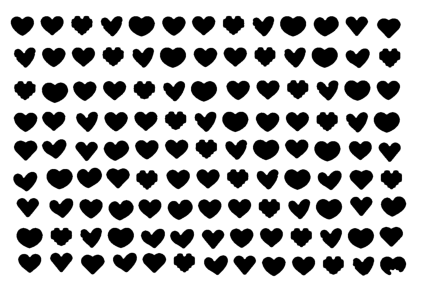

In [10]:
constrast_img = cv2.convertScaleAbs(img_2, -1, 1)

kernel = cv2.getGaussianKernel(200, 25) 
blurred_img = cv2.filter2D(src=b, ddepth=-1, kernel=kernel)
new_img = b-blurred_img
img_binary = cv2.threshold(new_img, 128, 255, cv2.THRESH_BINARY_INV)[1]
show_img([b, blurred_img, new_img, img_binary], (30,100), cmap='gray')
footprint=disk(5)
closed_2 = closing(img_binary, footprint)

footprint=disk(3)
opened = opening(closed_2, footprint)

opened[0:20, 0:], opened[:, 0:10] = 255, 255

show_img([opened], cmap='gray')

## Picture 3

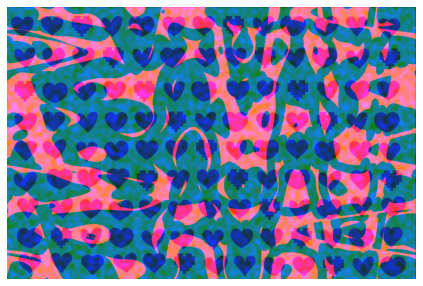

In [11]:
img_3=hearts[2][..., ::-1]
show_img([img_3])

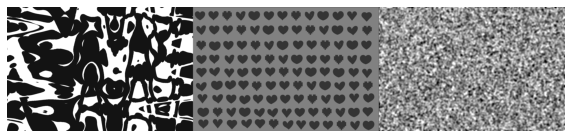

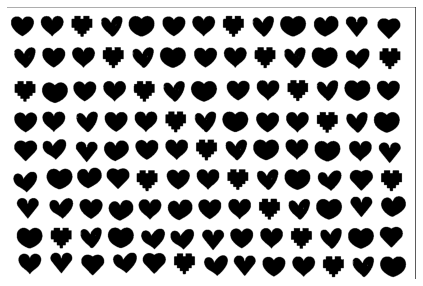

In [12]:
r, g, b = cv2.split(img_3)
#r, g, b = img_3[..., 0], img_3[..., 1], img_3[..., 2]
show_img([r, g, b], cmap='gray')
img_binary = cv2.threshold(g, 100, 255, cv2.THRESH_BINARY)[1]

show_img([img_binary], cmap='gray')

## Picture 4

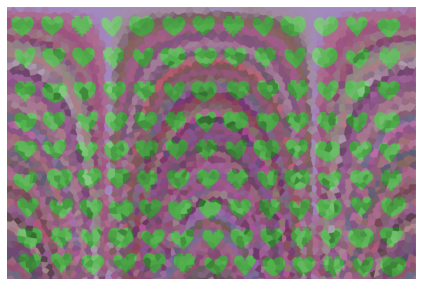

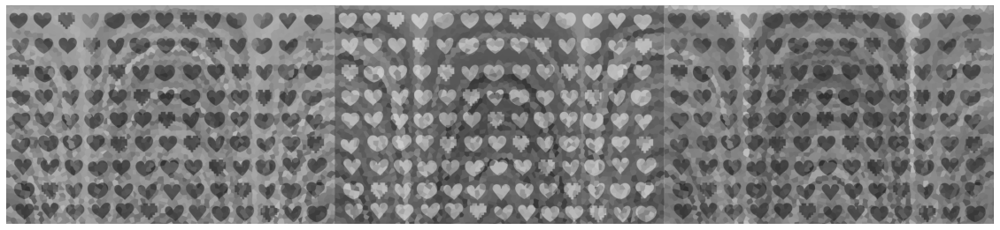

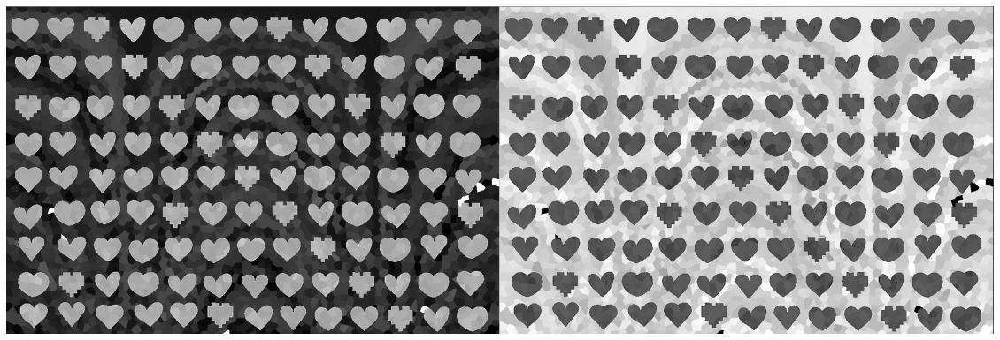

In [13]:
img_4=hearts[3][...,::-1]
show_img([img_4])
r, g, b = img_4[..., 0], img_4[..., 1], img_4[..., 2]


show_img([r, g, b], cmap='gray', figsize=(20,10))
show_img([r-g, g-r], cmap='gray', figsize=(20,30))

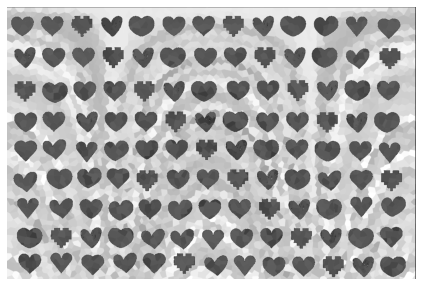

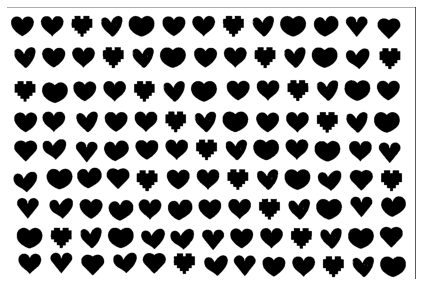

In [14]:
image = g-r
for x in range(len(image)):
    for y in range(len(image[0])):
        if image[x][y] < 10:
            image[x][y]=255

show_img([image], cmap='gray')
image = (image > 128) * 255
show_img([image], cmap='gray')


## Picture 5

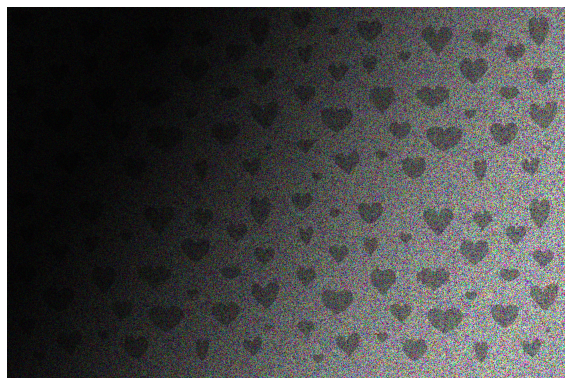

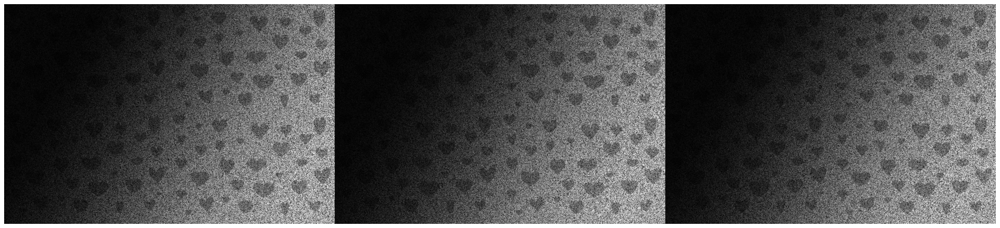

In [15]:
img_5 = hearts[4]
b,g,r = cv2.split(img_5)
show_img([img_5], figsize=(10,10))
show_img([r, g, b], figsize=(30,30), cmap='gray')


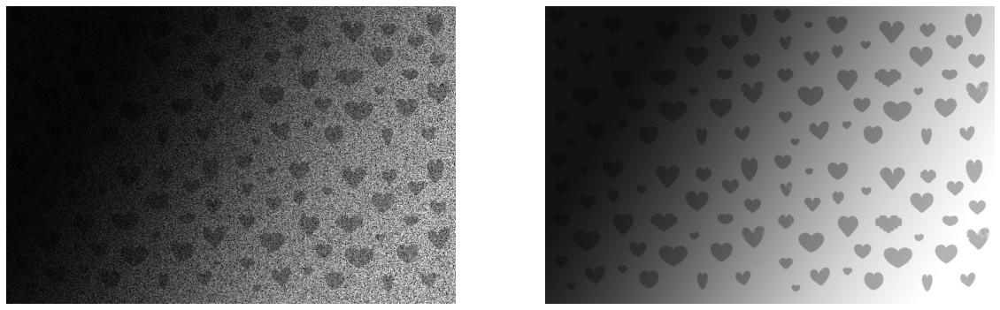

In [16]:
footprint = disk(5)
closed = closing(r, footprint)
compare_images_morph(r, closed)

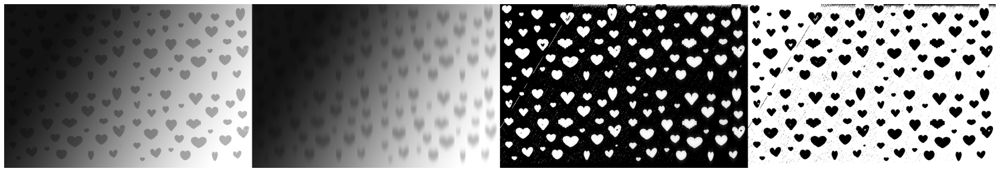

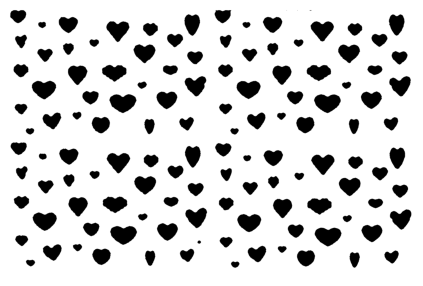

In [17]:
kernel = cv2.getGaussianKernel(100, 15) 
blurred_img = cv2.filter2D(src=closed, ddepth=-1, kernel=kernel)
new_img = closed-blurred_img
img_binary = cv2.threshold(new_img, 128, 255, cv2.THRESH_BINARY_INV)[1]

show_img([closed, blurred_img, new_img, img_binary], (30,100), cmap='gray')

footprint=disk(3)
closed_2 = closing(img_binary, footprint)

footprint=disk(7)
opened = opening(closed_2, footprint)

opened[0:10, 0:] = 255

show_img([opened], cmap='gray')


## Picture 6

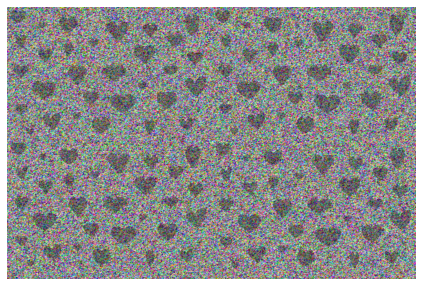

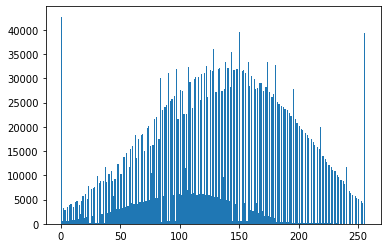

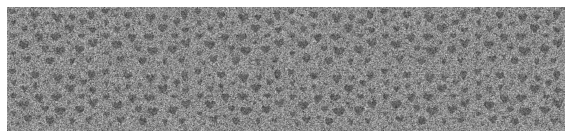

In [18]:
img_6 = hearts[5]
show_img([img_6])
b,g,r = cv2.split(img_6)
plt.hist(img_6.flatten(), 256, [0, 256])
plt.show()
show_img([r, g, b], cmap='gray')

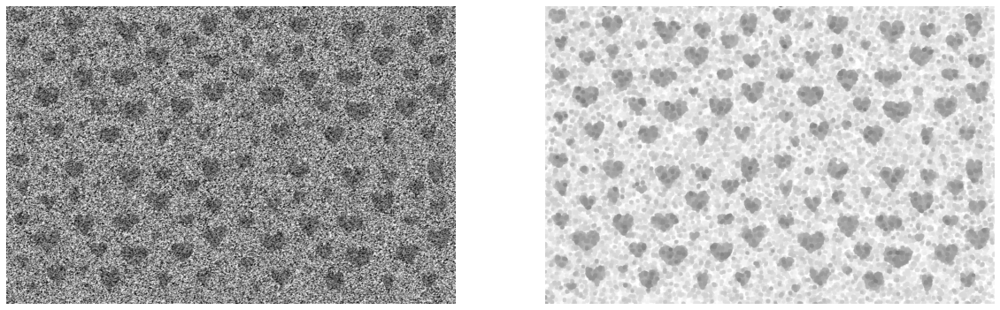

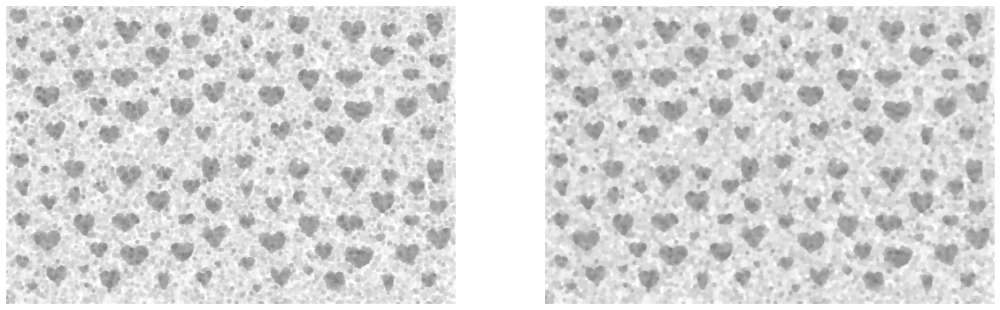

In [19]:

footprint = disk(5)
closed_1 = closing(r, footprint)
compare_images_morph(r, closed_1)
footprint = disk(3)
opened = opening(closed_1, footprint)
compare_images_morph(closed_1, opened)


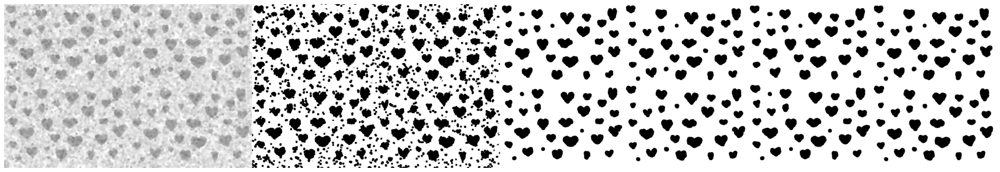

In [20]:
footprint = disk(5)
closed_1 = closing(r, footprint)
block_size = 201
threshold = threshold_local(closed_1, block_size, offset=10)
binary_local = (closed_1 > threshold) * 255
footprint=disk(10)
closed_2 = closing(binary_local, footprint)

footprint=disk(5)
opened_1 = opening(closed_2, footprint)
opened_1[0:11, :], opened_1[-15:, :]  = 255, 255



show_img([opened, binary_local, closed_2, opened_1], cmap='gray', figsize=(30, 20))


## Picture 7

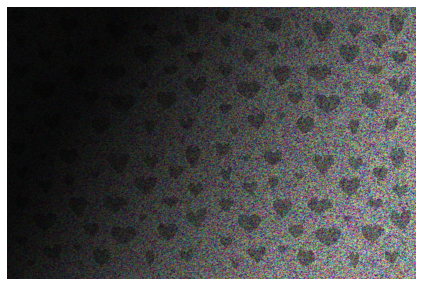

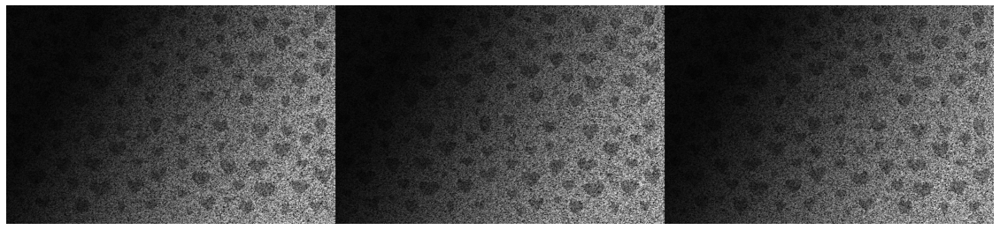

In [21]:
img_7 = hearts[6]
show_img([img_7])
b,g,r = cv2.split(img_7)
show_img([b,g,r], cmap='gray', figsize=(20,20))

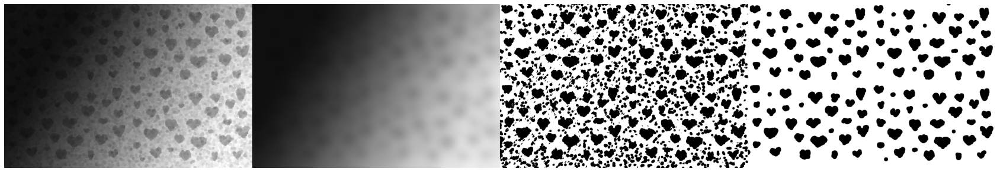

In [22]:
footprint=disk(6)
closed = closing(b, footprint)

img_gaus = gaussian_filter(closed, sigma=25)
binary = (closed > img_gaus)*255
footprint=disk(10)
closed_2 = closing(binary, footprint)

show_img([closed, img_gaus, binary, closed_2], cmap='gray', figsize=(30,30))


## Picture 8

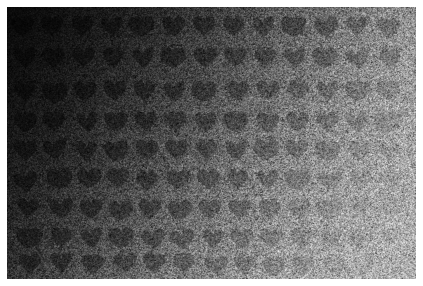

In [23]:
img_8 = hearts[7]
img_8 = cv2.imread("hearts 8.png")
	
gray = cv2.cvtColor(img_8, cv2.COLOR_BGR2GRAY)
show_img([img_8])
b, g, r = cv2.split(img_8)

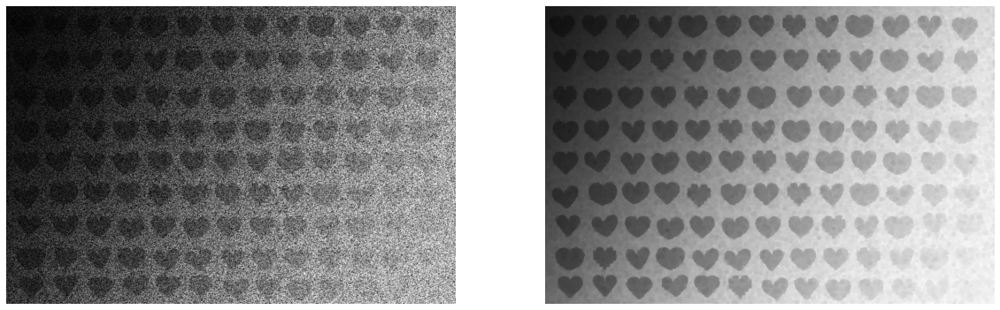

In [24]:
footprint = disk(5)
closed = closing(r, footprint)
compare_images_morph(img_8, closed)

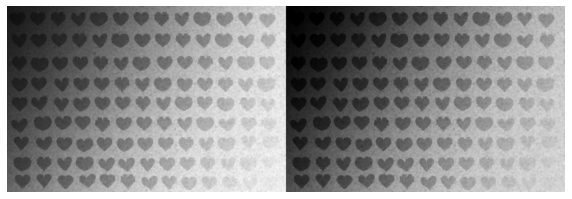

In [25]:
footprint=disk(4)
closed = closing(b, footprint)

new_img = [[max(pixel - 25, 0) if pixel < 128 else min(pixel - 25, 255) for pixel in row] for row in closed]
show_img([closed, new_img], cmap='gray')

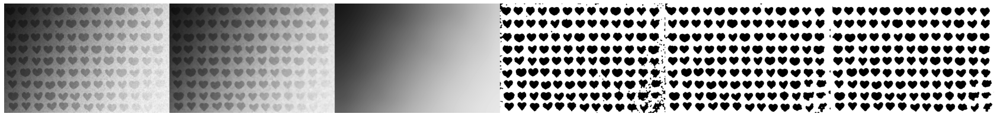

In [26]:
footprint=disk(5)
opened_1 = opening(closed, footprint)
img_gaus = gaussian_filter(opened_1, sigma=50)
binary = (opened_1 > img_gaus) * 255
footprint=disk(7)
closed_2 = closing(binary, footprint)
footprint=disk(4)
opened_2 = opening(closed_2, footprint)
opened_2[:10, :], opened_2[:, :15], opened_2[-10:, :],  opened_2[:, -15:] = 255, 255, 255, 255
 
show_img([closed, opened_1, img_gaus, binary, closed_2, opened_2], cmap='gray', figsize=(30,30))


## Picture 9

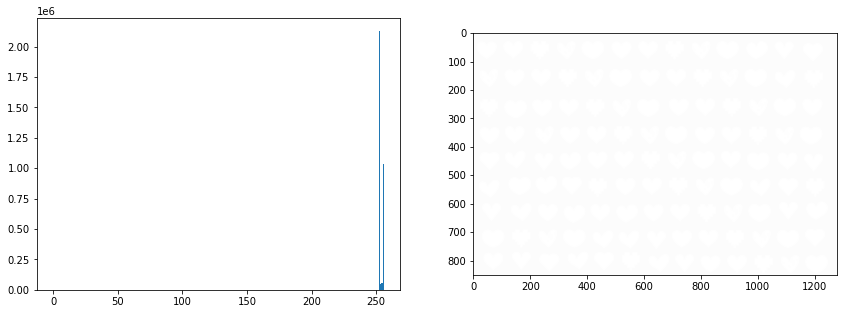

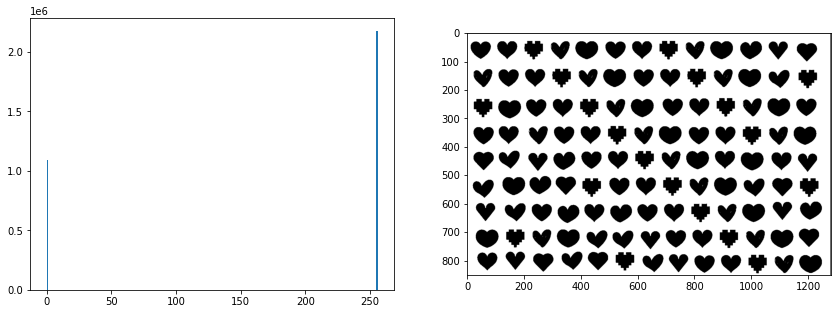

In [27]:
img_9 = hearts[8]
plt.figure(figsize=(30,5))
plt.subplot(141); plt.hist(img_9.flatten(), 256, [0, 256]); 
plt.subplot(142); plt.imshow(hearts[8]); 

img_binary = cv2.threshold(img_9, 253, 255, cv2.THRESH_BINARY_INV)[1]
plt.figure(figsize=(30,5))
plt.subplot(141); plt.hist(img_binary.flatten(), 256, [0, 256]); 
plt.subplot(142); plt.imshow(img_binary); 

## Picture 10

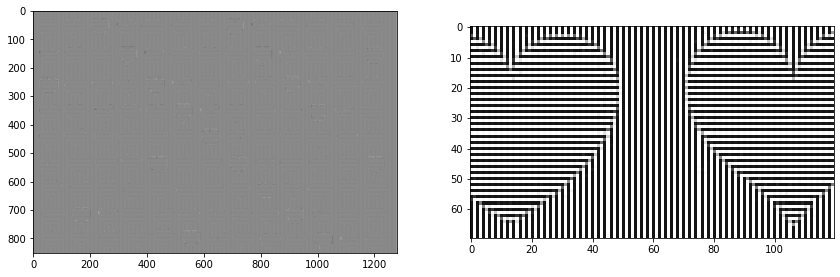

In [28]:
img_10=hearts[9][...,::-1];
plt.figure(figsize=(30,5))
plt.subplot(141); plt.imshow(img_10)
plt.subplot(142); plt.imshow(img_10[230:300, 230:350])

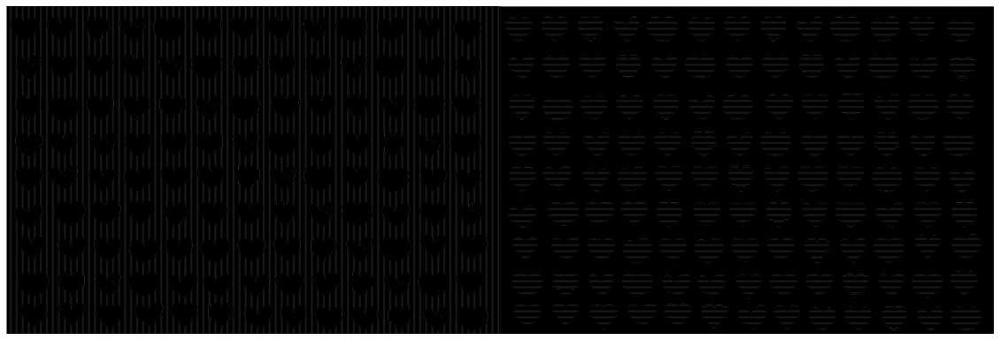

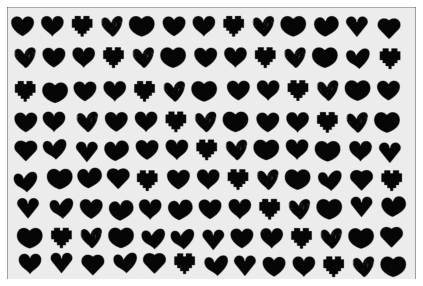

In [29]:
img = img_10[:,:,2]
grad_x = correlate(img.astype(np.float32), np.array([-1, 1]).reshape((1, 2)))
grad_y = correlate(img.astype(np.float32), np.array([-1, 1]).reshape((2, 1)))
grad = np.sqrt(grad_x**2, grad_y**2)

show_img([grad_x*2, grad_y*2], cmap='gray', figsize=(20,20))
show_img([grad], cmap='gray')
